In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

import rasterio
import geopandas as gpd

from shapely.geometry import Polygon

import iceplant_detection_functions as ipf

In [2]:
def mask_ndvi_add_my_and_predict(itemid, reduce_box, rfc, month, is_2018):
    image = ipf.open_window_in_scene(itemid, reduce_box)
    veg = ipf.select_ndvi_df(image)
    veg['month'] = month
    veg['2018'] = is_2018
    index = veg.index
    features = np.array(veg)
    predictions_class = rfc.predict(features)
    c = {'prediction': predictions_class}
    predictions_df = pd.DataFrame(c, index = index)
    
    return ipf.predictions_backto_image(image,predictions_df)

# -----------------------------------------------------------------------------------

def mask_ndvi_add_m_and_predict(itemid, reduce_box, rfc, month):
    image = ipf.open_window_in_scene(itemid, reduce_box)
    veg = ipf.select_ndvi_df(image)
    veg['month'] = month

    index = veg.index
    features = np.array(veg)
    predictions_class = rfc.predict(features)
    c = {'prediction': predictions_class}
    predictions_df = pd.DataFrame(c, index = index)
    
    return ipf.predictions_backto_image(image,predictions_df)

In [3]:
aois = gpd.read_file(os.path.join(os.getcwd(),'areas_of_interest','areas_of_interest.shp'))

In [4]:
fp = os.path.join(os.getcwd(),'training_set','aux_data','naip_point_samples',
                  'ca_m_3411934_sw_11_060_20200521_points.csv')
features2020 = pd.read_csv(fp)

fp = os.path.join(os.getcwd(),'training_set','aux_data','naip_point_samples',
                  'ca_m_3412037_nw_10_060_20200607_points.csv')
features2020 = pd.concat([features2020,pd.read_csv(fp)])

features2020.drop(['geometry','Unnamed: 0','x','y','day','year'],axis=1,inplace=True)
ipf.iceplant_proportions(features2020.iceplant.to_numpy())

no-iceplant:iceplant ratio     7.2 :1
          counts  percentage
iceplant                    
0         115812       87.84
1          16027       12.16



In [5]:
features2020.head(2)

,iceplant,r,g,b,nir,month
0,1,80,83,70,142,5
1,1,87,97,71,155,5


In [6]:
train_features, test_features, train_labels, test_labels = ipf.test_train_from_df(features2020)

ipf.train_test_shapes(train_features, train_labels, test_features, test_labels)
ipf.test_train_proportions(train_labels, test_labels)

Training Features Shape: (92287, 5)
Training Labels Shape: (92287,)
Testing Features Shape: (39552, 5)
Testing Labels Shape: (39552,)

TRAIN SET COUNTS:
no-iceplant:iceplant ratio     7.2 :1
          counts  percentage
iceplant                    
0          81047       87.82
1          11240       12.18

TEST SET COUNTS:
no-iceplant:iceplant ratio     7.3 :1
          counts  percentage
iceplant                    
0          34765        87.9
1           4787        12.1



In [7]:
rfc2020 = RandomForestClassifier(n_estimators = 100, 
                                      random_state = 42)
rfc2020.fit(train_features,train_labels)

#predictions = rfc2020.predict(test_features)
#ipf.print_threshold_metrics(test_labels, predictions)


true negatives: 34575     false positives: 190
false negatives: 306     true positives: 4481

sensitivity (TP/P): 93.61 %
specificity (TN/N): 99.45 %
G-mean:  0.96

precision (TP/(TP+FP)): 95.93 %

MCC:  0.9405283672168937

F1-measure:  0.94756
F0.5-measure (min false positives):  0.95458
F2-measure (min false negatives)  :  0.94064

accuracy: 98.75 %



In [9]:
cp = aois.iloc[0]  # Campus Lagoon aoi
cp_itemid= 'ca_m_3411934_sw_11_060_20200521'
original = np.moveaxis(ipf.rgb_window_in_scene(cp_itemid, cp.geometry),0,-1)
predictions = mask_ndvi_add_m_and_predict(cp_itemid, cp.geometry, rfc2020, month=5)


/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_2157/2591105805.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month


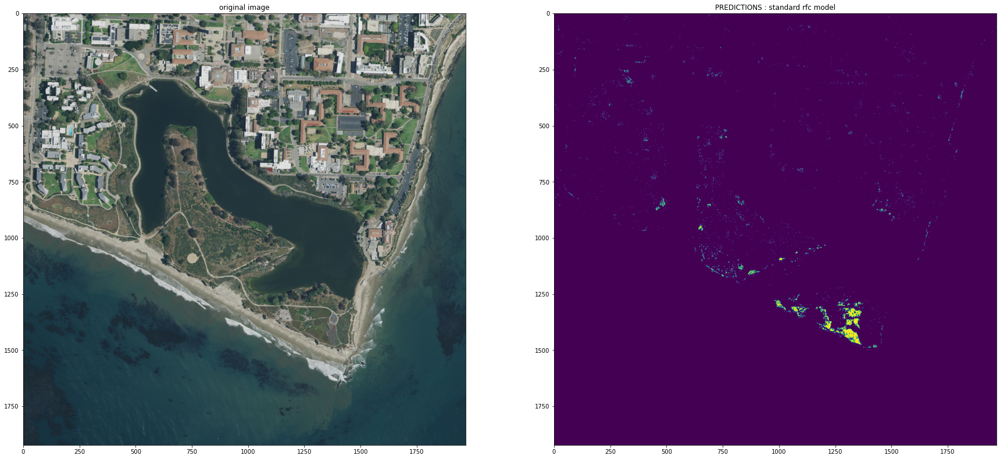

In [12]:
fig, ax = plt.subplots(1,2,figsize=(30, 40))

ax[0].imshow(predictions)
ax[0].set_title("PREDICTIONS : standard rfc model")

ax[1].imshow(original)
ax[1].set_title("original image")

plt.show()

In [16]:
conc = aois.iloc[4]  # Conception Point
conc_itemid= 'ca_m_3412037_nw_10_060_20200607'
original = np.moveaxis(ipf.rgb_window_in_scene(conc_itemid, conc.geometry),0,-1)
predictions = mask_ndvi_add_m_and_predict(conc_itemid, conc.geometry, rfc2020, month=6)

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_2219/2591105805.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month


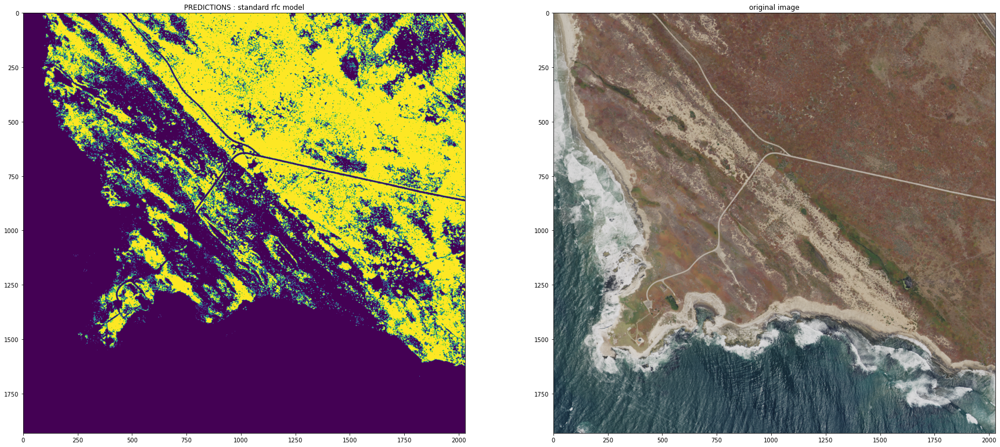

In [17]:
fig, ax = plt.subplots(1,2,figsize=(30, 40))

ax[0].imshow(predictions)
ax[0].set_title("PREDICTIONS : standard rfc model")

ax[1].imshow(original)
ax[1].set_title("original image")

plt.show()

# ADDING ALL YEARS

In [10]:
fp = os.path.join(os.getcwd(),'training_set','aux_data','dangermond_and_campuspoint.csv')
features2018 = pd.read_csv(fp)

fp = os.path.join(os.getcwd(),'training_set','aux_data','dangermond_non_iceplant.csv')
features2018 = pd.concat([features2018,pd.read_csv(fp)])

features2018.drop(['geometry','Unnamed: 0','x','y','day','year'],axis=1,inplace=True)
ipf.iceplant_proportions(features2018.iceplant.to_numpy())

no-iceplant:iceplant ratio     3.8 :1
          counts  percentage
iceplant                    
0          20999       79.04
1           5567       20.96



In [11]:
# one-hot encoding
features2018['2018']=1
features2020['2018']=0

In [12]:
all_years = pd.concat([features2018,features2020])
ipf.iceplant_proportions(all_years.iceplant.to_numpy())

no-iceplant:iceplant ratio     6.3 :1
          counts  percentage
iceplant                    
0         136811       86.37
1          21594       13.63



In [13]:
train_features, test_features, train_labels, test_labels = ipf.test_train_from_df(all_years)

rfc = RandomForestClassifier(n_estimators = 100, random_state = 42)
rfc.fit(train_features,train_labels)

#predictions = rfc.predict(test_features)
#ipf.print_threshold_metrics(test_labels, predictions)

RandomForestClassifier(random_state=42)

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_2219/2591105805.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month
/tmp/ipykernel_2219/2591105805.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

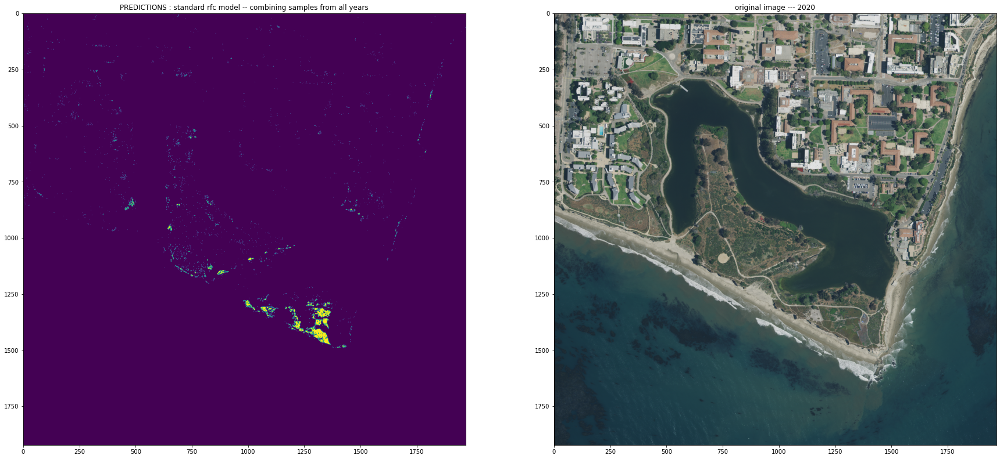

In [19]:
cp = aois.iloc[0]  # Campus Lagoon aoi
cp_itemid= 'ca_m_3411934_sw_11_060_20200521'
original = np.moveaxis(ipf.rgb_window_in_scene(cp_itemid, cp.geometry),0,-1)
predictions = mask_ndvi_add_my_and_predict(cp_itemid, cp.geometry, rfc, month=5, is_2018=0)

# -----------

fig, ax = plt.subplots(1,2,figsize=(30, 40))

ax[0].imshow(predictions)
ax[0].set_title("PREDICTIONS : standard rfc model -- combining samples from all years")

ax[1].imshow(original)
ax[1].set_title("original image --- 2020")

plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_2219/2591105805.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month
/tmp/ipykernel_2219/2591105805.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

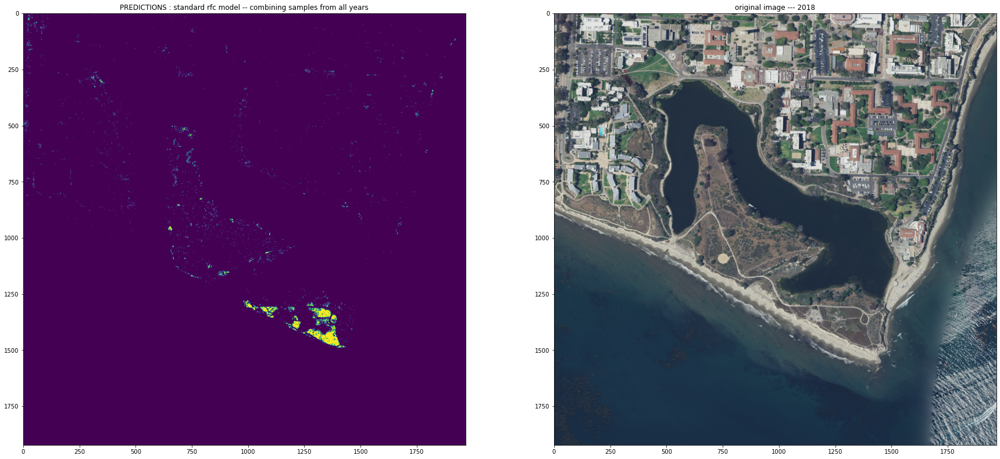

In [20]:
original = np.moveaxis(ipf.rgb_window_in_scene(cp.itemid, cp.geometry),0,-1)
predictions = mask_ndvi_add_my_and_predict(cp.itemid, cp.geometry, rfc, month=7, is_2018=1)

# -----------

fig, ax = plt.subplots(1,2,figsize=(30, 40))

ax[0].imshow(predictions)
ax[0].set_title("PREDICTIONS : standard rfc model -- combining samples from all years")

ax[1].imshow(original)
ax[1].set_title("original image --- 2018")

plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_2219/2591105805.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month
/tmp/ipykernel_2219/2591105805.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

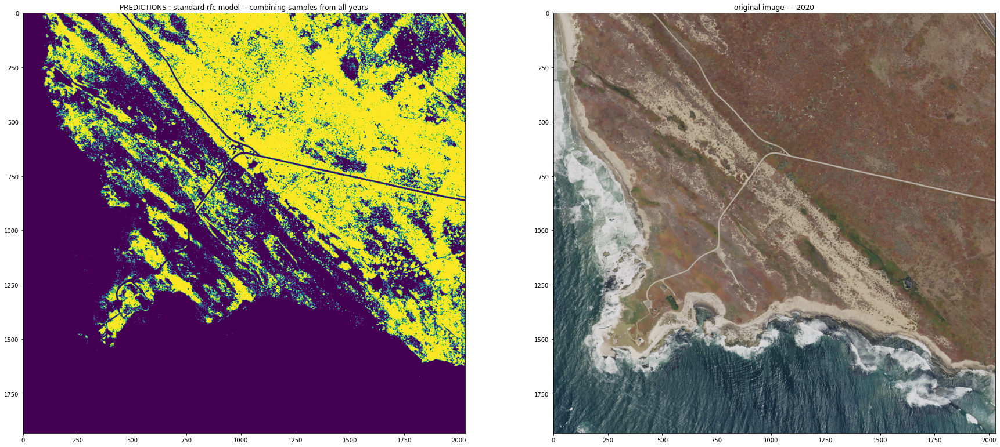

In [22]:
conc = aois.iloc[4]  # Conception Point
conc_itemid= 'ca_m_3412037_nw_10_060_20200607'
original = np.moveaxis(ipf.rgb_window_in_scene(conc_itemid, conc.geometry),0,-1)
predictions = mask_ndvi_add_my_and_predict(conc_itemid, conc.geometry, rfc, month=6, is_2018=0)

# -----------

fig, ax = plt.subplots(1,2,figsize=(30, 40))

ax[0].imshow(predictions)
ax[0].set_title("PREDICTIONS : standard rfc model -- combining samples from all years")

ax[1].imshow(original)
ax[1].set_title("original image --- 2020")

plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_2219/2591105805.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month
/tmp/ipykernel_2219/2591105805.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

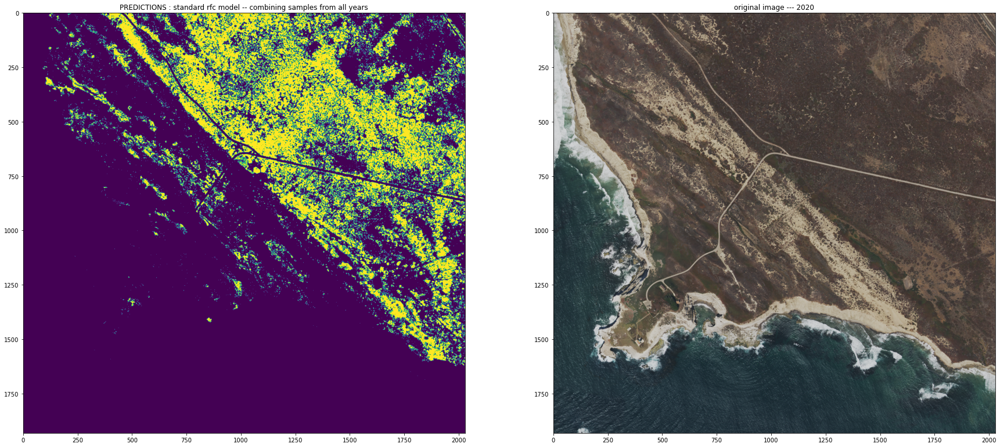

In [24]:
conc = aois.iloc[4]  # Conception Point
original = np.moveaxis(ipf.rgb_window_in_scene(conc.itemid, conc.geometry),0,-1)
predictions = mask_ndvi_add_my_and_predict(conc_itemid, conc.geometry, rfc, month=9, is_2018=1)

# -----------

fig, ax = plt.subplots(1,2,figsize=(30, 40))

ax[0].imshow(predictions)
ax[0].set_title("PREDICTIONS : standard rfc model -- combining samples from all years")

ax[1].imshow(original)
ax[1].set_title("original image --- 2018")

plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_2219/2591105805.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month
/tmp/ipykernel_2219/2591105805.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

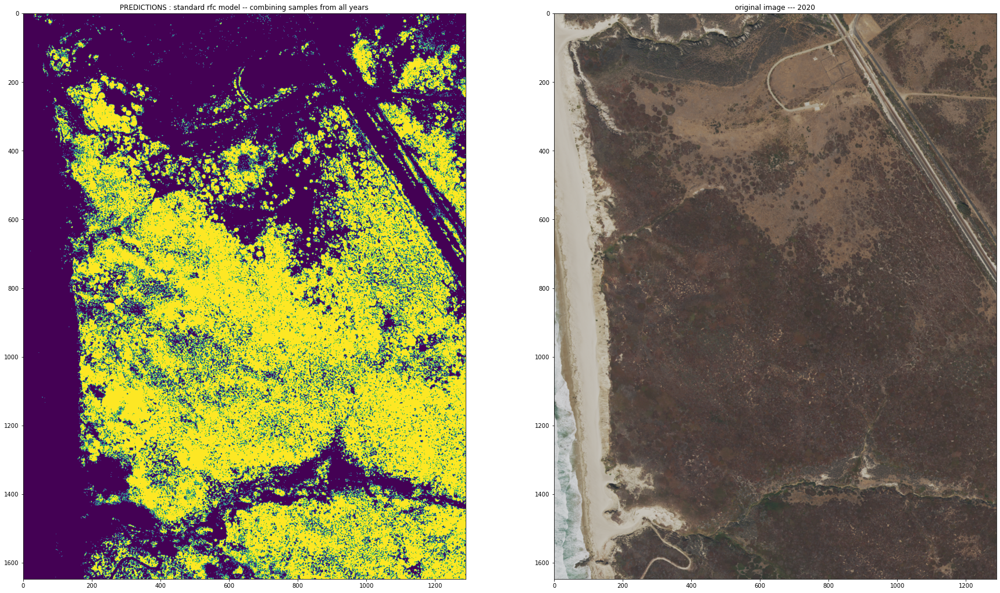

In [25]:
itemid = 'ca_m_3412037_nw_10_060_20180913_20190208'
test_plots = Polygon([[-120.473906278,34.4592345994],
                      [-120.4657518158,34.4592345994],
                      [-120.4657518158,34.4679835909],
                      [-120.473906278,34.4679835909],
                      [-120.473906278,34.4592345994]])

original = np.moveaxis(ipf.rgb_window_in_scene(itemid, test_plots),0,-1)
predictions = mask_ndvi_add_my_and_predict(itemid, test_plots, rfc, month=9, is_2018=1)

# -----------

fig, ax = plt.subplots(1,2,figsize=(15, 25))

ax[0].imshow(predictions)
ax[0].set_title("PREDICTIONS : standard rfc model -- combining samples from all years")

ax[1].imshow(original)
ax[1].set_title("original image --- 2020")

plt.show()

/home/jovyan/msai4earth-esa/iceplant_detection/iceplant_detection_functions.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vegetation.drop(labels=['ndvi'],axis=1, inplace=True)
/tmp/ipykernel_2219/2591105805.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veg['month'] = month
/tmp/ipykernel_2219/2591105805.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

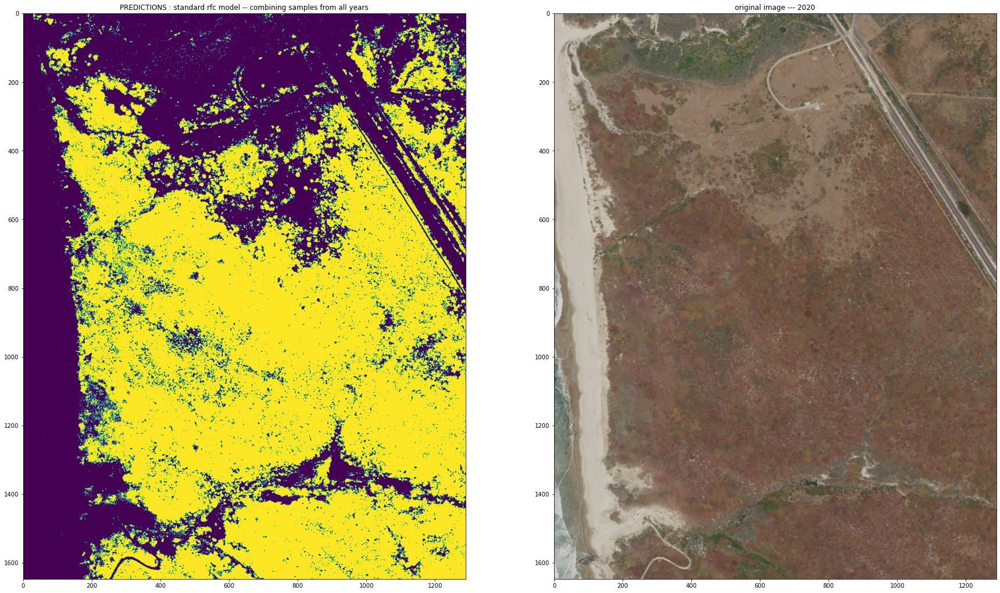

In [26]:
itemid = 'ca_m_3412037_nw_10_060_20200607'

original = np.moveaxis(ipf.rgb_window_in_scene(itemid, test_plots),0,-1)
predictions = mask_ndvi_add_my_and_predict(itemid, test_plots, rfc, month=6, is_2018=0)

# -----------

fig, ax = plt.subplots(1,2,figsize=(15, 25))

ax[0].imshow(predictions)
ax[0].set_title("PREDICTIONS : standard rfc model -- combining samples from all years")

ax[1].imshow(original)
ax[1].set_title("original image --- 2020")

plt.show()